In [1]:
#Optional, specify period of analysis. 1 year ='1y' as period_input, 1 month = '1mo' as period_input
period_input='1y'
interval_input='1d'

import pickle
import warnings
import datetime as dt
import pandas as pd
import pandas_datareader.data as web
import numpy as np
import matplotlib.pyplot as plt
import requests 
import yfinance as yf
import matplotlib.dates as mdates
import plotly.express as px
from pandas_datareader import data as pdr
from pandas import ExcelWriter
import datetime
from datetime import datetime
import cufflinks as cf
import plotly.graph_objects as go
from plotly.offline import iplot, init_notebook_mode
import matplotlib.pyplot as plt
import mplfinance as mpf

pd.core.common.is_list_like = pd.api.types.is_list_like
warnings.filterwarnings('ignore')
cf.go_offline()
init_notebook_mode()

price_min=30
price_max=250
stocklist = pd.read_excel('Stocks.xlsx', sheet_name='Rus1000')
stocklist.drop_duplicates(subset=None, keep='first', inplace=True, ignore_index=True)
stocklist = stocklist[:].copy()

madeit = []

In [2]:
def Get_data(symbol,period_input='6mo', interval_input='1d'):
    df = yf.download(tickers=f'{symbol}', period=period_input, interval=interval_input, progress=False)     
    df['Symbol']=symbol
    df=df[['Adj Close','Open','High','Low','Volume','Symbol']]
    return df   
    
def Get_MA(df):
    #EMAS
    df['Ema_8'] = df['Adj Close'].ewm(span = 8, min_periods=8, adjust=False).mean().round(2)
    df['Ema_13'] = df['Adj Close'].ewm(span = 13, min_periods=13, adjust=False).mean().round(2)
    df['Ema_21'] = df['Adj Close'].ewm(span = 21, min_periods=21, adjust=False).mean().round(2)
    #SMAS
    df['Sma_13'] = df['Adj Close'].rolling(13).mean().round(2)
    df['Sma_50'] = df['Adj Close'].rolling(50).mean().round(2) 
    df['Sma_100'] = df['Adj Close'].rolling(100).mean().round(2) 
    

def Get_Atr(df):
    df['Close_lag_1'] = df['Adj Close'].shift(1)
    df['Tr'] = np.maximum(df['High']-df['Low'], np.maximum(abs(df['High']-df['Close_lag_1']), abs(df['Low']-df['Close_lag_1'])))
    df['Atr'] = df['Tr'].rolling(window = 13).mean()
    df.drop(['Close_lag_1'], axis=1, inplace=True)  
    

def Get_Bollinger(df):
    df['Std_13'] = df['Adj Close'].rolling(window = 13).std()
    df['Bollinger_up'] = df['Ema_13'] + 2*df['Std_13']
    df['Bollinger_down'] = df['Ema_13'] - 2*df['Std_13']
    
    
def Get_Screening_Values(df):
    highest_high = round(max(df['High']),2)
    lowest_low = round(min(df['Low']),2)
    exp_8 = df["Ema_8"][-1]
    exp_21 = df["Ema_21"][-1]
    simp_50 = df["Sma_50"][-1]
    simp_100 = df["Sma_100"][-1]
    atr_loc = df['Atr'][-1]
    atr = round(abs(atr_loc),2)
    current_close = round(df['Adj Close'][-1],2)
    high_5 = round(max(df['Adj Close'].tail(5)),2)
    high_50 = round(max(df['Adj Close'].tail(50)),2)   
    return [highest_high, lowest_low, exp_8, exp_21, simp_50
            , simp_100, atr, current_close, high_5, high_50]

def Get_Vwap(df):
    df['VolXClose']= round(df['Volume']*df['Adj Close'],2)
    df['VWAP13']= round(df.VolXClose.rolling(13).sum()/df.Volume.rolling(13).sum(),2)
    df.drop(['VolXClose'], axis=1, inplace=True)
    
def Get_Atr_Bands(df):
    df['Atr_up'] = df['Ema_13']  +  (df['Atr'] * 1.5)
    df['Atr_down'] = df['Ema_13']  -  (df['Atr'] * 1.5)     
    df['Squeeze_On'] = (df['Bollinger_down'] > df['Atr_down']) & (df['Bollinger_up'] < df['Atr_up'])
    df['Squeeze_Off'] = (df['Bollinger_down'] < df['Atr_down']) & (df['Bollinger_up'] > df['Atr_up'])

def Get_Squeeze_Values(df):
    highest_13 = df['High'].rolling(window = 13).max()
    lowest_13 = df['Low'].rolling(window = 13).min()
    m1 = (highest_13 + lowest_13) / 2
    df['Value'] = (df['Adj Close'] - (m1 + df['Ema_13'])/2)
    fit_y = np.array(range(0,13))
    df['Value'] = df['Value'].rolling(window = 13).apply(lambda x : np.polyfit(fit_y, x, 1)[0])

    
def Summary():
    rundate = datetime.today().strftime('%m-%d-%y')
    summarystring = ', '.join(str(e) for e in madeit)
    begdate = df.index[0].strftime('%m-%d-%y')
    enddate = df.index[-1].strftime('%m-%d-%y')
    print(' Analysis of 1000 stocks compelte on {}.\
          \n Graphing results between {} and {} for {}.'.format(rundate, begdate, enddate, summarystring))

    

In [3]:
for symbol in stocklist['Symbol']:
    try: 
        df = Get_data(symbol, period_input, interval_input)
        Get_MA(df)
        Get_Atr(df)
    
        [highest_high, lowest_low, exp_8, exp_21, simp_50, simp_100
         , atr, current_close, high_5, high_50] = Get_Screening_Values(df)

        if (price_min<current_close<price_max):
            cond_1=True
        else:
            cond_1=False         
        if ((current_close>simp_50) and (current_close>simp_100)):
            cond_2=True
        else:
            cond_2=False         
        if(current_close>(1.2*lowest_low)):
            cond_3=True
        else:
            cond_3=False
        if(current_close>(.7*highest_high)):
            cond_4=True
        else:
            cond_4=False  
        if(high_5 < (high_50 + 1.5*atr)):
            cond_5=True
        else:
            cond_5=False                  
        if(exp_8 + 1.5*atr > exp_21):
            cond_6=True
        else:
            cond_6=False                        
        if(cond_1 and cond_2 and cond_3 and cond_4 and cond_5 and cond_6):   
            madeit.append(symbol)  
    except:
        print(symbol)
        print('delisted')
      


 Analysis of 1000 stocks compelte on 03-18-22.          
 Graphing results between 03-19-21 and 03-18-22 for AA, ABBV, ABC, ACC, ACHC, ACI, ACM, ADM, AFG, AFL, AGCO, AGO, AIG, AIRC, AIZ, AJG, AKAM, ALK, ALL, ALNY, ALSN, AN, ANET, APA, ARES, ARW, ATO, ATVI, AVB, AVT, AXP, AXS, BAH, BEPC, BFAM, BG, BKR, BLDR, BMY, BRO, BWXT, BXP, BYD, CAH, CAT, CCK, CDK, CERN, CF, CFR, CHDN, CHRW, CI, CINF, CLH, CLR, CMA, CME, CNC, CNXC, CONE, COP, CR, CSL, CSX, CTSH, CTVA, CVS, CVX, CW, DAR, DG, DLTR, DTM, DVA, DVN, DXC, ED, EEFT, EHC, EOG, EPR, EQR, EXC, EXPE, FANG, FCX, FE, FLS, FMC, FNF, GD, GDDY, GO, H, HAL, HEI, HES, HFC, HHC, HLT, HOG, HOLX, HPQ, HRL, HSIC, HSY, HUN, HWM, HXL, HZNP, ICE, ICUI, INCY, IPG, IRM, J, JAMF, JAZZ, JBHT, JBL, JKHY, JNPR, KEX, KR, KRC, KSS, L, LDOS, LHX, LNG, LOPE, LPLA, LPX, LYB, MAR, MET, MMC, MO, MOS, MPC, MRCY, MTB, NBIX, NEM, NFG, NI, NTAP, NUAN, NUE, NVST, NXST, OC, OGE, OGN, OKE, OMC, ON, OXY, PAG, PAYX, PFE, PGR, PKG, PKI, PLAN, PRU, PSTG, PWR, PXD, R, REXR, RGLD, 

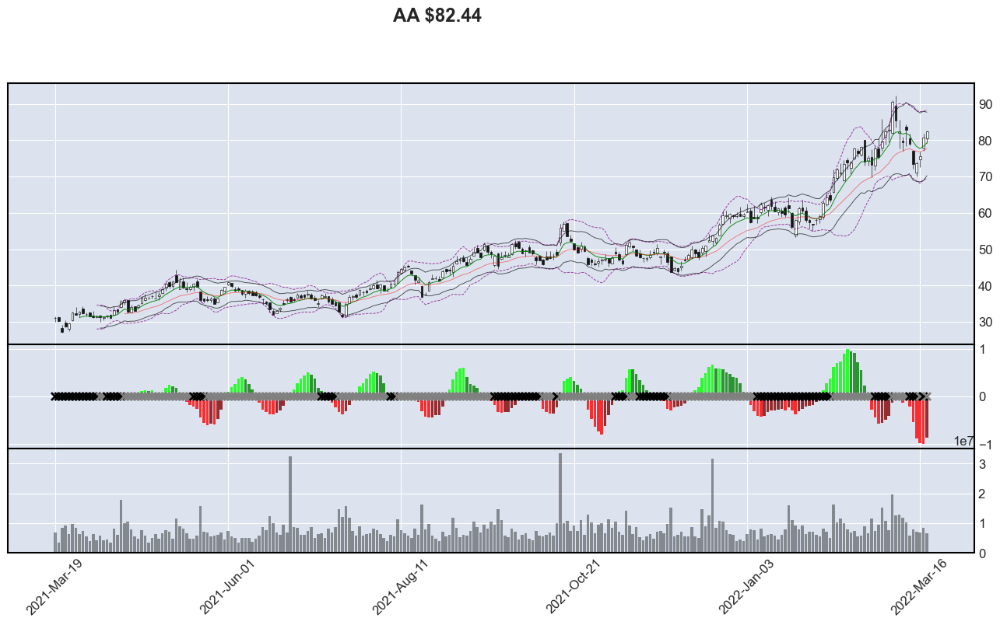

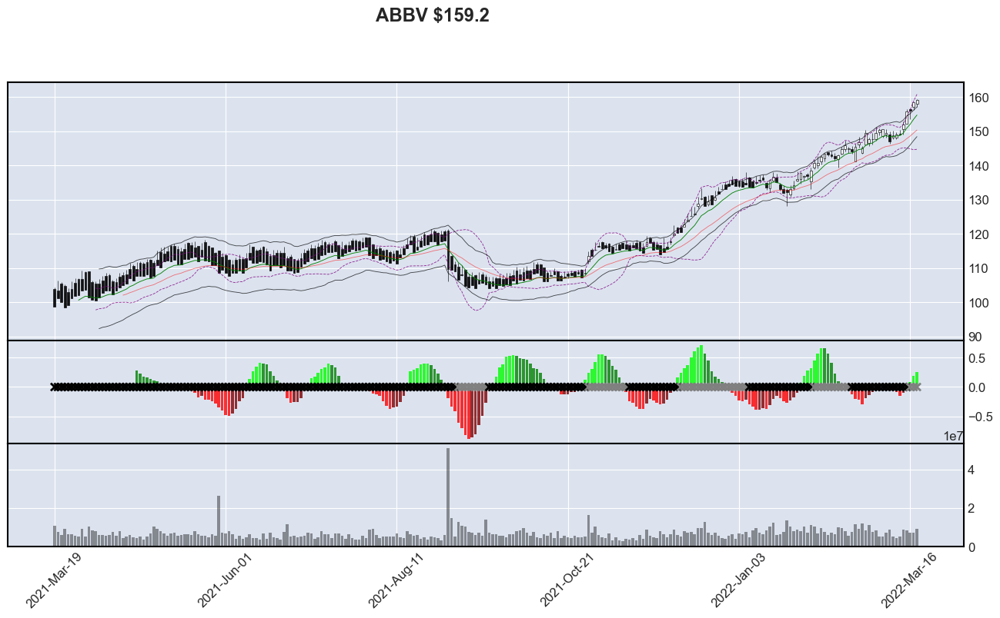

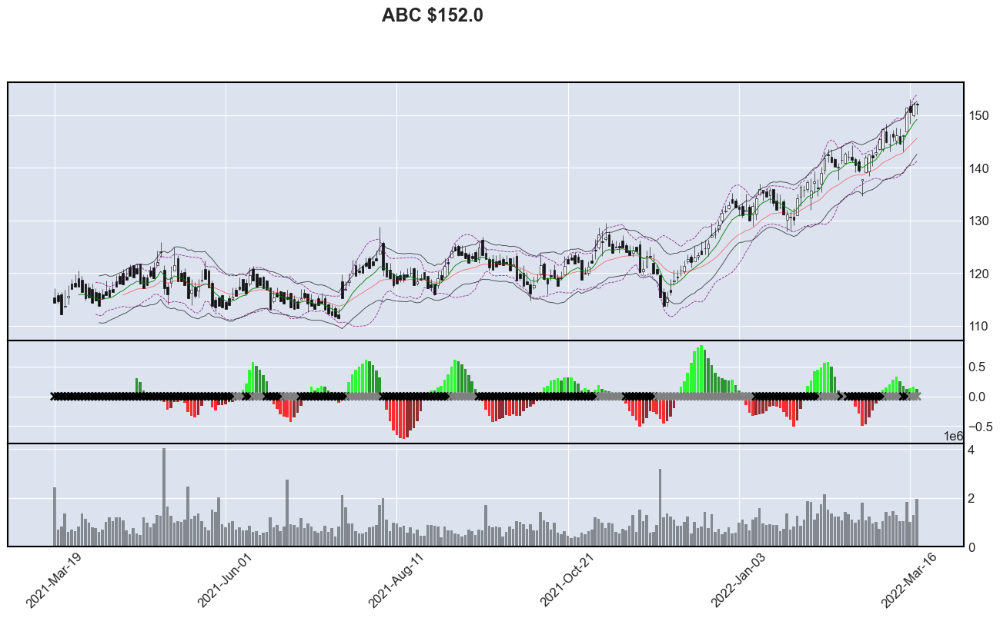

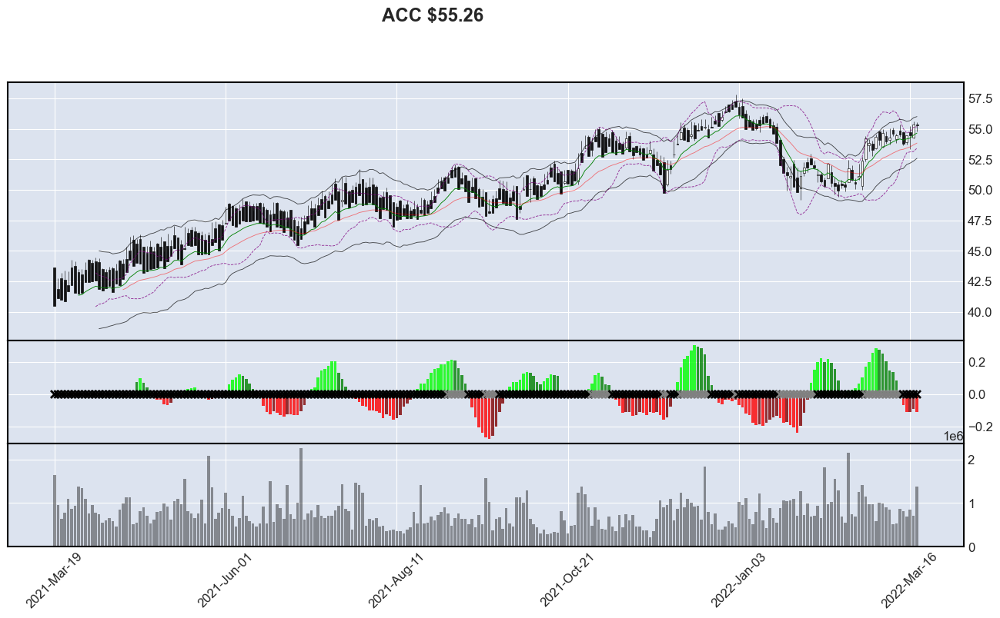

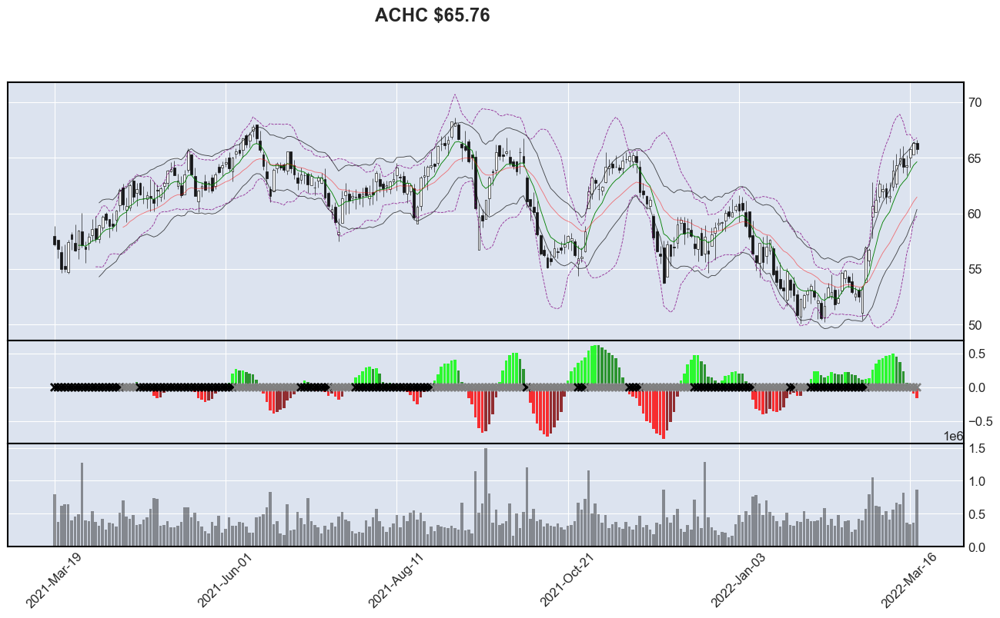

...

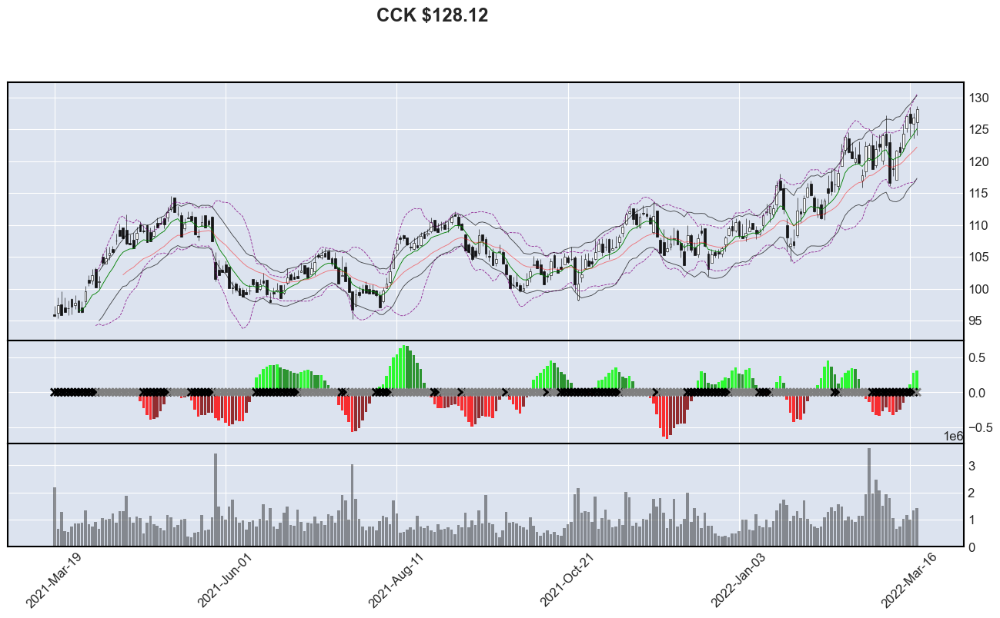

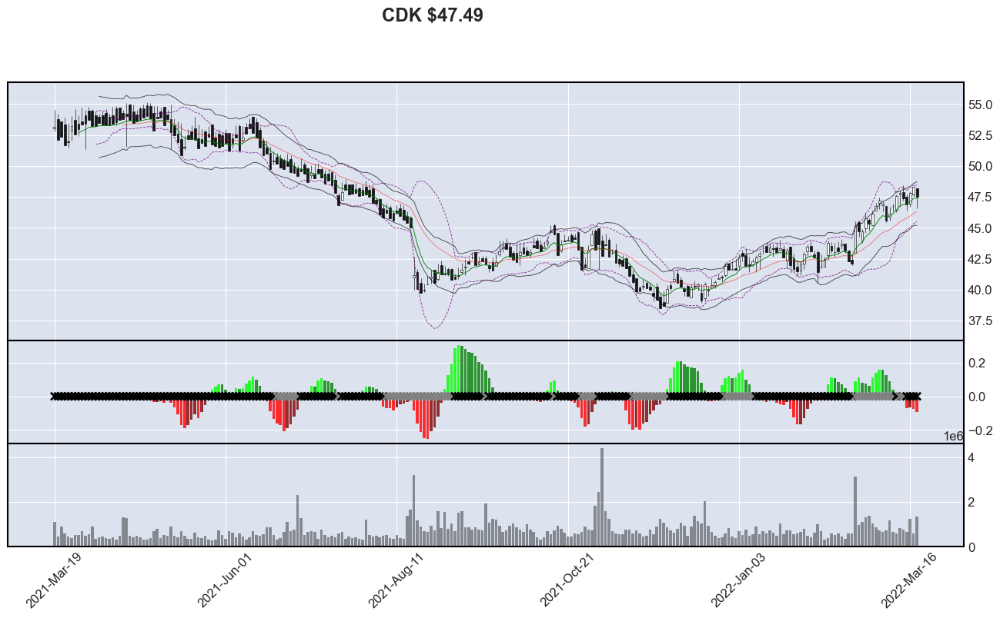

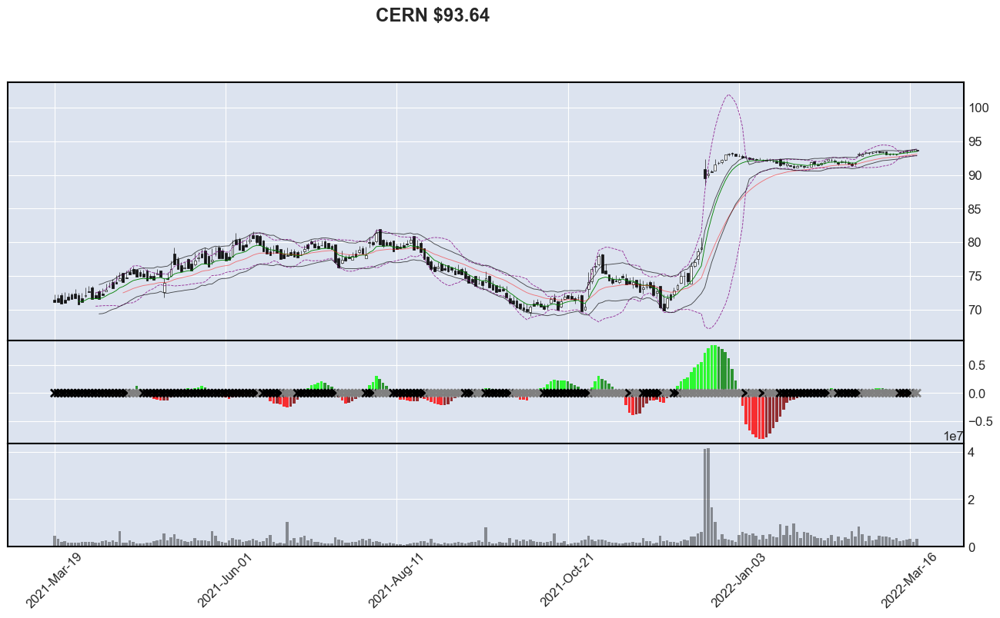

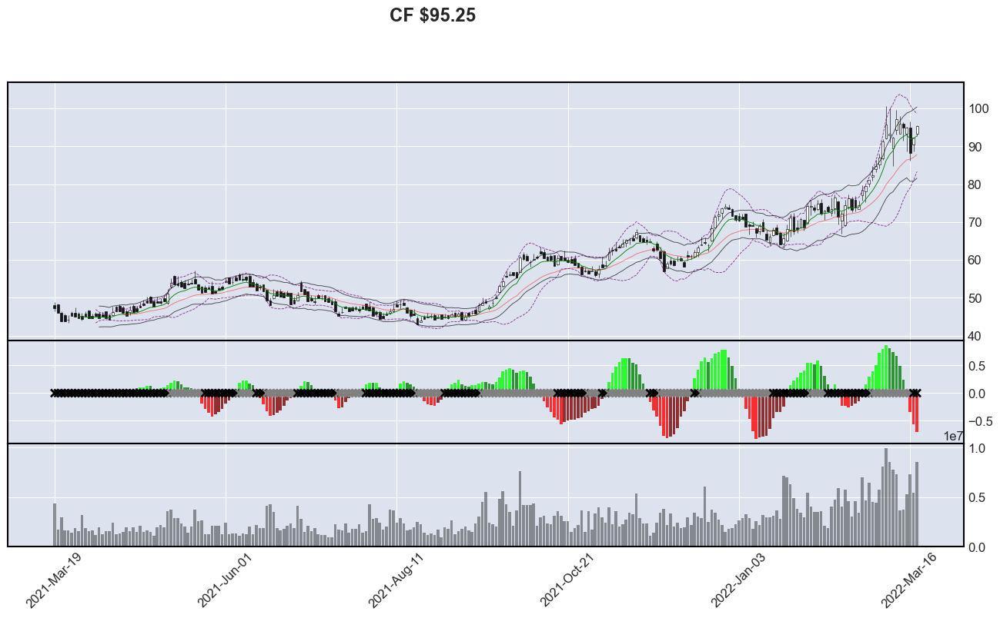

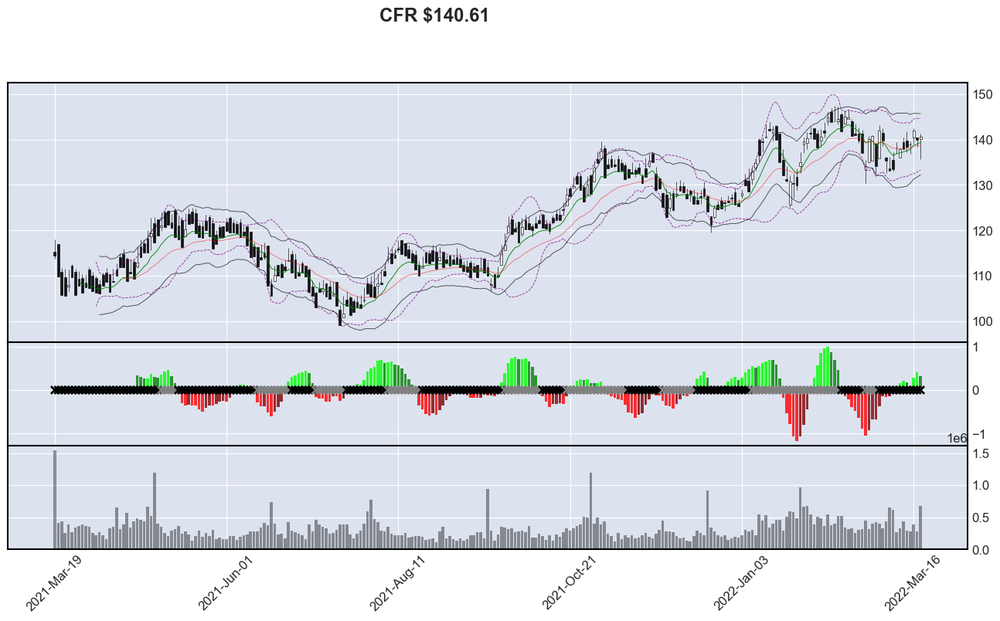

In [8]:
Summary()
# for symbol in madeit:     
for symbol in madeit[:50]:        
    df = Get_data(symbol, period_input, interval_input)
    Get_MA(df)
    Get_Atr(df)
    
    ohcl = df[['Open', 'High', 'Adj Close', 'Low','Volume']]   
    ohcl.rename(columns={'Adj Close': 'Adj_Close'}, inplace=True)
    
    Get_Vwap(df)
    Get_Bollinger(df)
    Get_Atr_Bands(df)
    [highest_high, lowest_low, exp_8, exp_21, simp_50
            , simp_100, atr, current_close, high_5, high_50] = Get_Screening_Values(df)
    Get_Squeeze_Values(df)

    colors = []
    for ind, val in enumerate(df['Value']):
      if val >= 0:
        color = 'green'
        if val > df['Value'][ind-1]:
          color = 'lime'
      else:
        color = 'maroon'
        if val < df['Value'][ind-1]:
          color='red'
      colors.append(color)
    
    
    apds = [mpf.make_addplot(df['Value'], panel=1, type='bar', color=colors, alpha=0.8, secondary_y=False, y_on_right=True),           
            mpf.make_addplot([0] * len(df), panel=1, type='scatter', marker='x', markersize=50, color=['gray' if s else 'black' for s in df['Squeeze_Off']], secondary_y=False),
            mpf.make_addplot(df['Ema_8'],type='line',color='green', alpha=1, y_on_right=True),
            mpf.make_addplot(df['Ema_21'],type='line',color='red',alpha=.5),
            mpf.make_addplot(df['Bollinger_up'], panel=0, type='line',color='purple', alpha=.8, linestyle='--'),
            mpf.make_addplot(df['Bollinger_down'], panel=0, type='line',color='purple', alpha=.8, linestyle='--'),
            mpf.make_addplot(df['Atr_up'], panel=0, type='line',color='black', alpha=.7),
            mpf.make_addplot(df['Atr_down'], panel=0, type='line',color='black', alpha=.7),
            mpf.make_addplot(df['Volume'],type='bar',color='black',panel=2, alpha=.4, secondary_y=False, y_on_right=True)         
           ]
    
    ohcl.rename(columns={'Adj_Close': 'Close'}, inplace=True)
    
    
    fig, axes = mpf.plot(ohcl, 
                  title = f'{symbol} ${current_close}',
                  ylabel='',
                  figratio=(2,1),
                  figscale=1.5, 
                  type='candle', 
                  addplot=apds,
                  scale_width_adjustment=dict(candle=1.5,lines=0.5),
                  returnfig=True
                  )
    


In [5]:
with open('screened_stocks.pkl', 'wb') as pickle_file:
    pickle.dump(madeit, pickle_file)